In [1]:
import matplotlib.pyplot as plt

import scipy.io.wavfile as file
import scipy.signal as signal

import operator

import os

import numpy as np
from numpy import (atleast_1d, poly, polyval, roots, real, asarray,
                   resize, pi, absolute, logspace, r_, sqrt, tan, log10,
                   arctan, arcsinh, sin, exp, cosh, arccosh, ceil, conjugate,
                   zeros, sinh, append, concatenate, prod, ones, full, array,
                   mintypecode)

from numpy.polynomial.polynomial import polyval as npp_polyval

import math

import IPython.display as ipd

import warnings
warnings.filterwarnings('ignore')

In [2]:
input_path = "_input"
output_path = "_output"
input_name = "test"
full_dir = input_path + "/" + input_name + ".wav"
low_freq = 500
hig_freq = 2000
order = 10

new_dir = os.path.dirname(full_dir)
sr, w = file.read(full_dir)
w = w.astype('float')
w_name = os.path.basename(full_dir).split('.wav')[0]
output_name_postfix = 'new'

In [3]:
def leaky_integrator(lamda, input):
    # single pole at lamda
    b = [1-lamda]
    a = [1, -lamda]
    output = signal.lfilter(b,a, input)
    return output, a, b

def DC_removal(lamda, input):
    # used to remove direct current or in other words value at f = 0
    # can be achieved taking one zero and one pole 
    b = [1, -1]
    a = [1, -lamda]
    output = signal.lfilter(b,a, input)
    return output, a, b

def resonator(G, lamda, omega, input):
    # narrow bandpass filter
    # can be achieved using leaky integrator technique shifting the pole simmetrically
    # used to detect a sinusoid of current frequency
    b = [G]
    a = [1, -2*lamda*math.cos(omega), abs(lamda)**2]
    output = signal.lfilter(b,a, input)
    return output, a, b

def hum_removal(G, lamda, omega, input):
    # it is a type of notch filter, and can be used to remove value at fixed frequency 
    # can be achieved using pole and zeros symmetrical shifting
    b = [1,-2*math.cos(omega), 1]
    a = [1,-2*lamda*math.cos(omega), abs(lamda)**2]
    output = signal.lfilter(b,a, input)
    return output, a, b

def bandpass_filtering(low_freq, hig_freq, order, input):
    # here low_freq and hig_freq are [0,1] segment numbers, the real freq is 
    # low_freq * max_freq, where max_freq = sample_rate / 2
    filter_coefs = signal.iirfilter(order, [low_freq, hig_freq], btype='bandpass', ftype='butter')
    b = filter_coefs[0];
    a = filter_coefs[1]
    output = signal.lfilter(b, a, input)
    return output, a, b

def lowpass_filtering(cutoff_freq, order, input):
    # here cutoff_freq is [0,1] segment number, the real freq is 
    # cutoff_freq * max_freq, where max_freq = sample_rate / 2
    filter_coefs = signal.iirfilter(order, cutoff_freq, btype = 'lowpass', ftype='butter')
    b = filter_coefs[0];
    a = filter_coefs[1]
    output = signal.lfilter(b, a, input)
    return output, a, b

def highpass_filtering(cutoff_freq, order, input):
    # here cutoff_freq is [0,1] segment number, the real freq is 
    # cutoff_freq * max_freq, where max_freq = sample_rate / 2
    filter_coefs = signal.iirfilter(order, cutoff_freq, btype = 'highpass', ftype='butter')
    b = filter_coefs[0]
    a = filter_coefs[1]
    output = signal.lfilter(b, a, input)
    return output, a, b

def random_filtering(input):
    b = np.array([1, 3 / 4 * np.random.rand() - 3 / 8, 3 / 4 * np.random.rand() - 3 / 8])
    a = np.array([1, 3 / 4 * np.random.rand() - 3 / 8, 3 / 4 * np.random.rand() - 3 / 8])
    output = signal.lfilter(b, a, input)
    return output, a, b

In [4]:
def plot_filter(b, a=1, worN=512, whole=False, plot=None, fs=2*pi):
    """
    Compute the frequency response of a digital filter.
    Given the M-order numerator `b` and N-order denominator `a` of a digital
    filter, compute its frequency response::
                 jw                 -jw              -jwM
        jw    B(e  )    b[0] + b[1]e    + ... + b[M]e
     H(e  ) = ------ = -----------------------------------
                 jw                 -jw              -jwN
              A(e  )    a[0] + a[1]e    + ... + a[N]e
    Parameters
    ----------
    b : array_like
        Numerator of a linear filter. If `b` has dimension greater than 1,
        it is assumed that the coefficients are stored in the first dimension,
        and ``b.shape[1:]``, ``a.shape[1:]``, and the shape of the frequencies
        array must be compatible for broadcasting.
    a : array_like
        Denominator of a linear filter. If `b` has dimension greater than 1,
        it is assumed that the coefficients are stored in the first dimension,
        and ``b.shape[1:]``, ``a.shape[1:]``, and the shape of the frequencies
        array must be compatible for broadcasting.
    worN : {None, int, array_like}, optional
        If a single integer, then compute at that many frequencies (default is
        N=512). This is a convenient alternative to::
            np.linspace(0, fs if whole else fs/2, N, endpoint=False)
        Using a number that is fast for FFT computations can result in
        faster computations (see Notes).
        If an array_like, compute the response at the frequencies given.
    whole : bool, optional
        Normally, frequencies are computed from 0 to the Nyquist frequency,
        fs/2 (upper-half of unit-circle). If `whole` is True, compute
        frequencies from 0 to fs. Ignored if w is array_like.
    plot : callable
        A callable that takes two arguments. If given, the return parameters
        `w` and `h` are passed to plot.
    fs : float, optional
        The sampling frequency of the digital system. Defaults to 2*pi
        radians/sample (so w is from 0 to pi).
    Returns
    -------
    w : ndarray
        The frequencies at which `h` was computed, in the same units as `fs`.
        By default, `w` is normalized to the range [0, pi) (radians/sample).
    h : ndarray
        The frequency response, as complex numbers.
    """
    def _is_int_type(x):
        """
        Check if input is of a scalar integer type (so ``5`` and ``array(5)`` will
        pass, while ``5.0`` and ``array([5])`` will fail.
        """
        if np.ndim(x) != 0:
            # Older versions of NumPy did not raise for np.array([1]).__index__()
            # This is safe to remove when support for those versions is dropped
            return False
        try:
            operator.index(x)
        except TypeError:
            return False
        else:
            return True
    
    b = atleast_1d(b)
    a = atleast_1d(a)

    if worN is None:
        # For backwards compatibility
        worN = 512

    h = None

    if _is_int_type(worN):
        N = operator.index(worN)
        del worN
        if N < 0:
            raise ValueError('worN must be nonnegative, got %s' % (N,))
        lastpoint = 2 * pi if whole else pi
        w = np.linspace(0, lastpoint, N, endpoint=False)
        if (a.size == 1 and N >= b.shape[0] and
                sp_fft.next_fast_len(N) == N and
                (b.ndim == 1 or (b.shape[-1] == 1))):
            # if N is fast, 2 * N will be fast, too, so no need to check
            n_fft = N if whole else N * 2
            if np.isrealobj(b) and np.isrealobj(a):
                fft_func = sp_fft.rfft
            else:
                fft_func = sp_fft.fft
            h = fft_func(b, n=n_fft, axis=0)[:N]
            h /= a
            if fft_func is sp_fft.rfft and whole:
                # exclude DC and maybe Nyquist (no need to use axis_reverse
                # here because we can build reversal with the truncation)
                stop = -1 if n_fft % 2 == 1 else -2
                h_flip = slice(stop, 0, -1)
                h = np.concatenate((h, h[h_flip].conj()))
            if b.ndim > 1:
                # Last axis of h has length 1, so drop it.
                h = h[..., 0]
                # Rotate the first axis of h to the end.
                h = np.rollaxis(h, 0, h.ndim)
    else:
        w = atleast_1d(worN)
        del worN
        w = 2*pi*w/fs

    if h is None:  # still need to compute using freqs w
        zm1 = exp(-1j * w)
        h = (npp_polyval(zm1, b, tensor=False) /
             npp_polyval(zm1, a, tensor=False))

    w = w*fs/(2*pi)

    if plot is not None:
        plot(w, h)
        return None

    return w, h

In [5]:
low_fname = str(int(low_freq / 1000)) + 'k'
hig_fname = str(int(hig_freq / 1000)) + 'k'

# obtaining frequencies as fractions
low_freq = low_freq * 2 / sr
hig_freq = hig_freq * 2 / sr

In [6]:
# filtering the input audio
# w_new, a, b = bandpass_filtering(low_freq, hig_freq, order, w)
# w_new, a, b = highpass_filtering(hig_freq, order, w)
# w_new, a, b = random_filtering(w)
# w_new, a, b = leaky_integrator(0.99, w)
# w_new, a, b = DC_removal(0.8, w)
# w_new, a, b = resonator(2, 0.99, math.pi /2, w)
# w_new, a, b = hum_removal(0.99, math.pi, w)
# plot_filter(a,b)


# new_name = w_name + '_' + output_name_postfix + '.wav'
# # new_path = os.path.join(new_dir, new_name)
# new_name = input_name + '_' + output_name_postfix + '.wav'
# new_path = os.path.join(output_path, new_name)

# file.write(new_path, sr, w_new.astype('int16'))
# print('File with new append {} is ready'.format(output_name_postfix))

## leaky_integrator

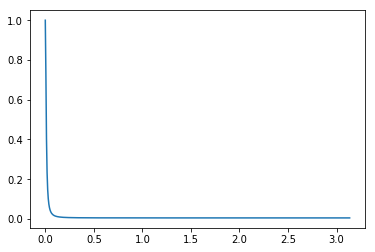

In [7]:
w_new, a, b = leaky_integrator(0.99, w)
plot_filter(b, a, plot=plt.plot)

In [8]:
ipd.Audio(w, rate=sr)

In [9]:
ipd.Audio(w_new, rate=sr)

## DC_removal

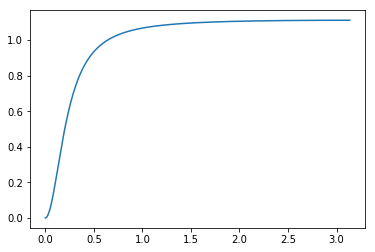

In [10]:
w_new, a, b = DC_removal(0.8, w)
plot_filter(b, a, plot=plt.plot)

In [11]:
ipd.Audio(w, rate=sr)

In [12]:
ipd.Audio(w_new, rate=sr)

## resonator

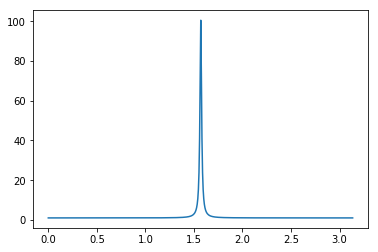

In [13]:
w_new, a, b = resonator(2, 0.99, math.pi /2, w)
plot_filter(b, a, plot=plt.plot)

In [14]:
ipd.Audio(w, rate=sr)

In [15]:
ipd.Audio(w_new, rate=sr)

## hum_removal

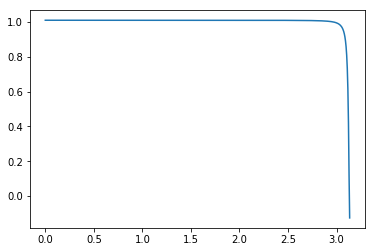

In [16]:
w_new, a, b = hum_removal(2, 0.99, math.pi, w)
plot_filter(b, a, plot=plt.plot)

In [17]:
ipd.Audio(w, rate=sr)

In [18]:
ipd.Audio(w_new, rate=sr)